연습문제 3

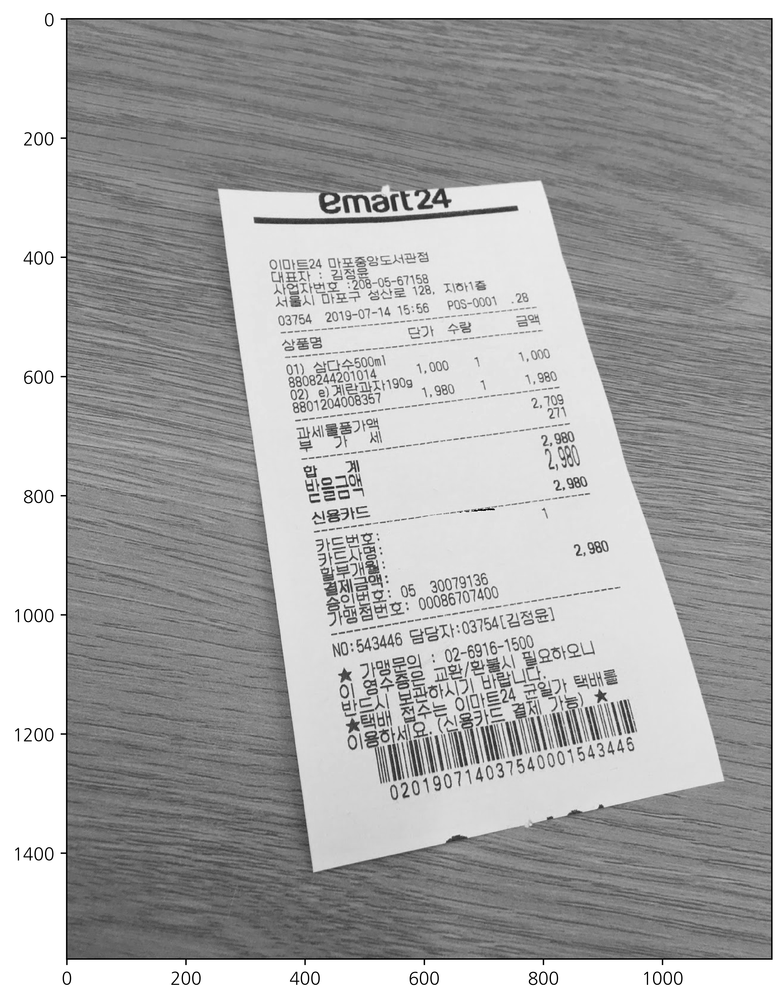

In [3]:
import cv2

img = cv2.imread("./receipt.png")
img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

plt.figure(figsize=(10, 10))
plt.imshow(img, cmap=plt.cm.gray)
plt.grid(False)
plt.show()

In [4]:
# 글자처럼 자잘한 것을 없애려면 closing사용 -> 경계선을 밀어넣었다 댕김. -> 글자같이
# 자잘한 애들은 밀어넣는 순간 없어짐. -> 그 다음 점점으로 남음 -> 미디엄 블러로 없앰

img_region = cv2.bilateralFilter(img, 30, 30, 30)
_, img_region = cv2.threshold(img_region, 180, 255, cv2.THRESH_BINARY)
img_region = cv2.medianBlur(img_region, 11)
img_region = cv2.morphologyEx(img_region, cv2.MORPH_CLOSE,
    cv2.getStructuringElement(cv2.MORPH_RECT, (30, 30)),
)

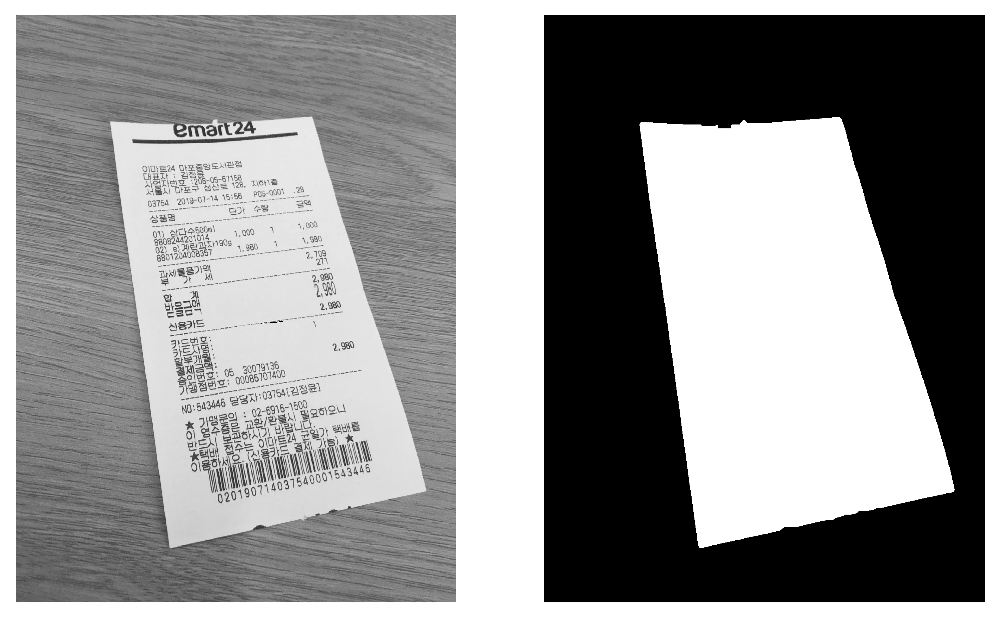

In [5]:
plt.subplot(121)
plt.imshow(img, cmap=plt.cm.gray)
plt.axis("off")
plt.subplot(122)
plt.imshow(img_region, cmap=plt.cm.gray)
plt.axis("off")
plt.show()

In [6]:
contours, hierachy = cv2.findContours(img_region, cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_KCOS)

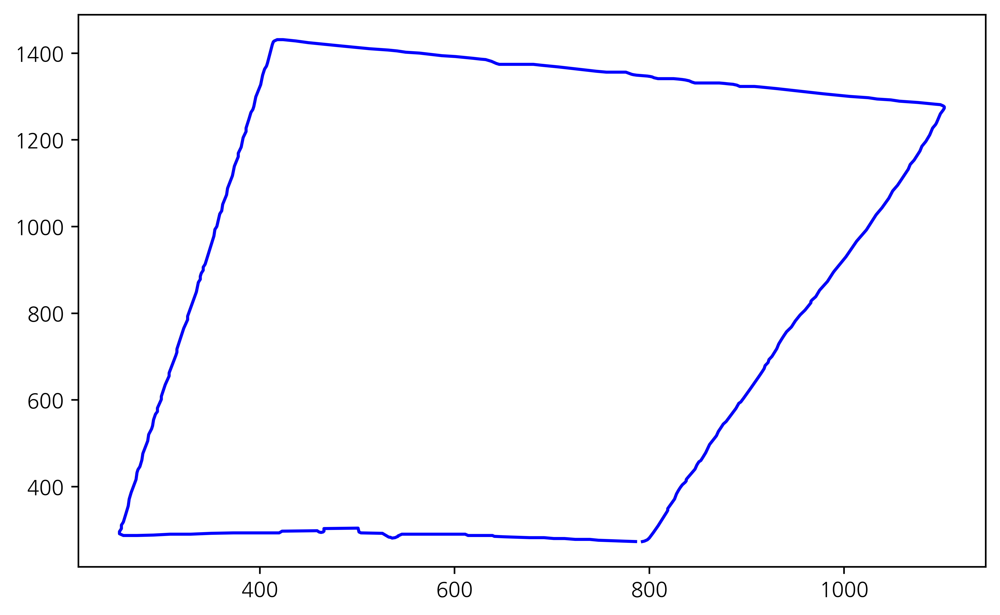

In [7]:
x0, y0 = zip(*np.squeeze(contours[0]))
plt.plot(x0, y0, c="b")
plt.show()

In [8]:
c0 = contours[0]
M = cv2.moments(c0)
M

{'m00': 677900.5,
 'm10': 436931814.0,
 'm01': 574869115.5,
 'm20': 306662276874.75,
 'm11': 381495955592.7916,
 'm02': 552032977712.5833,
 'm30': 230675195144452.8,
 'm21': 274788078993294.38,
 'm12': 373019539458745.6,
 'm03': 575929239695706.2,
 'mu20': 25043646876.202087,
 'mu11': 10971659699.82428,
 'mu02': 64535918843.68976,
 'mu30': 736971116230.9688,
 'mu21': 590897821907.8672,
 'mu12': -1394267514682.6719,
 'mu03': -1657180128098.875,
 'nu20': 0.05449613008836627,
 'nu11': 0.023874837288776853,
 'nu02': 0.14043313444177255,
 'nu30': 0.001947760622359324,
 'nu21': 0.0015616996161750966,
 'nu12': -0.003684946807715326,
 'nu03': -0.004379805567109594}

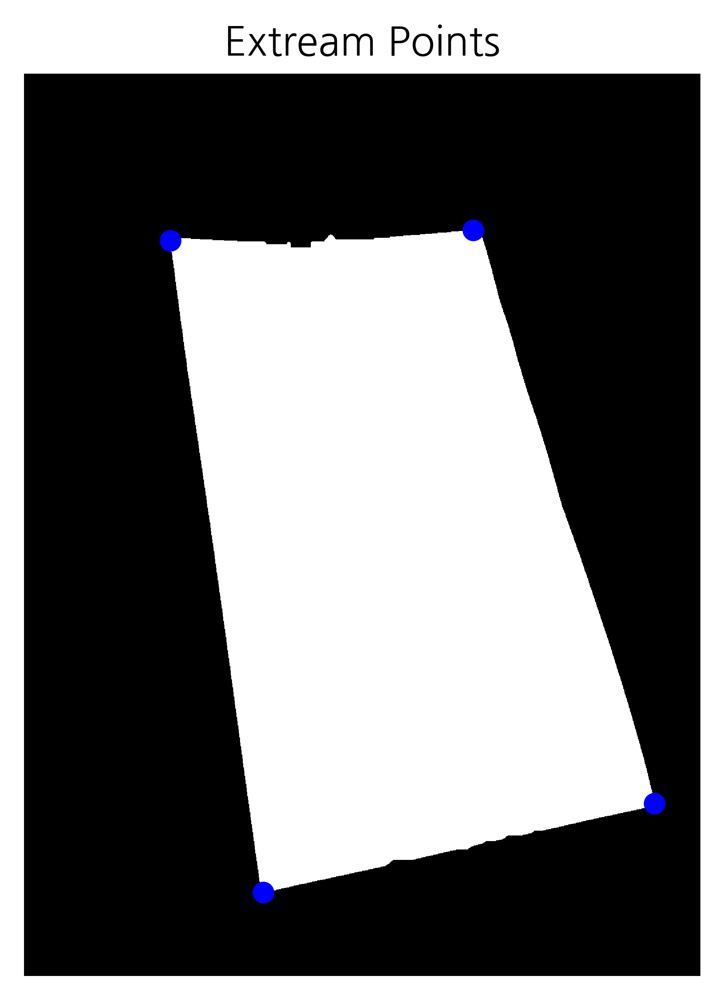

In [9]:
leftmost = tuple(c0[c0[:, :, 0].argmin()][0])
rightmost = tuple(c0[c0[:, :, 0].argmax()][0])
topmost = tuple(c0[c0[:, :, 1].argmin()][0])
bottommost = tuple(c0[c0[:, :, 1].argmax()][0])

plt.subplot(1,2,2)
plt.imshow(img_region, cmap='bone')
plt.axis("off")
plt.scatter(
    [leftmost[0], rightmost[0], topmost[0], bottommost[0]], 
    [leftmost[1], rightmost[1], topmost[1], bottommost[1]], 
    c="b", s=30)
plt.title("Extream Points")

plt.show()

In [10]:
pts1 = np.float32([list(leftmost), list(rightmost), list(topmost), list(bottommost)])
pts2 = np.float32([[0, 0], [1184, 1578], [1184, 0], [0, 1578]])

H_perspective = cv2.getPerspectiveTransform(pts1, pts2)
H_perspective

array([[ 2.16471653e+00, -3.07617612e-01, -4.64650706e+02],
       [ 6.83361970e-02,  2.01212136e+00, -6.03021381e+02],
       [-1.61696352e-04,  3.69132335e-04,  1.00000000e+00]])

In [12]:
rows, cols = img.shape[:2]

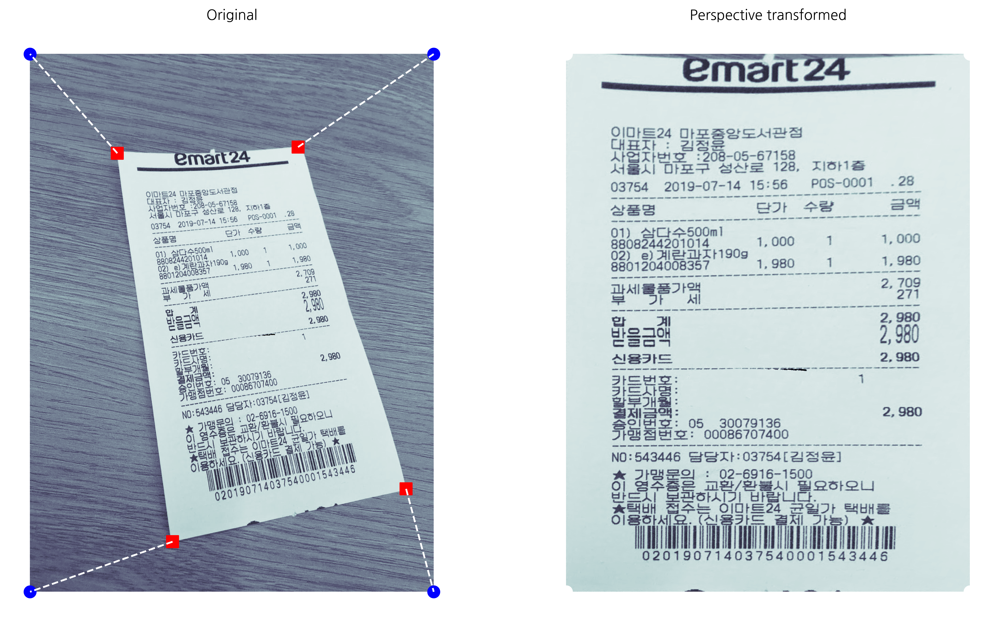

In [14]:
img2 = cv2.warpPerspective(img, H_perspective, (cols, rows))

fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(15, 15))

pts_x, pts_y = zip(*pts1)
pts_x_, pts_y_ = zip(*pts2)

ax1.set_title("Original")
ax1.imshow(img, cmap=plt.cm.bone)
ax1.scatter(pts_x, pts_y, c='r', s=100, marker="s")
ax1.scatter(pts_x_, pts_y_, c='b', s=100)
ax1.plot(list(zip(*np.stack((pts_x, pts_x_), axis=-1))),
         list(zip(*np.stack((pts_y, pts_y_), axis=-1))), "--", c="w")
ax1.axis("off")



ax2.set_title("Perspective transformed")
ax2.imshow(img2, cmap=plt.cm.bone)
ax2.scatter(pts_x_, pts_y_, c='w', s=100)
ax2.axis("off")
plt.show()

### 사운드 프로세싱

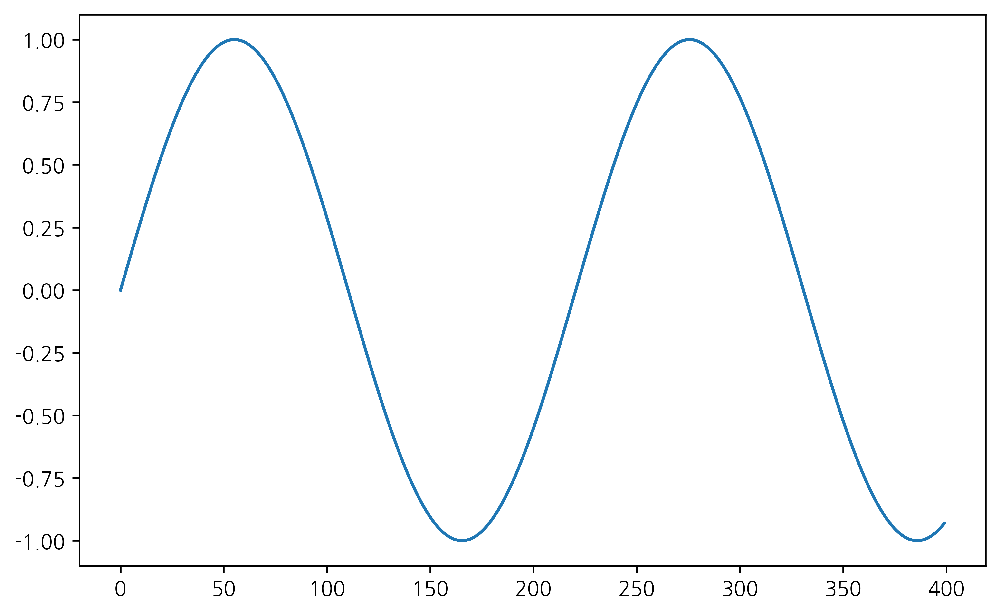

In [24]:
def single_tone(frequency, sampling_rate=44100, duration=0.5):
    t = np.linspace(0, duration, int(sampling_rate))
    y = np.sin(2 * np.pi *  frequency * t)
    return y

y = single_tone(400)

plt.plot(y[:400])
plt.show()

In [16]:
from IPython.display import Audio, display

display(Audio(y, rate=44100))


In [17]:
notes = 'C,C#,D,D#,E,F,F#,G,G#,A,A#,B,C'.split(',')
freqs = 261.62 * 2**(np.arange(0, len(notes)) / 12.)
notes = list(zip(notes, freqs))
notes

[('C', 261.62),
 ('C#', 277.17673474627884),
 ('D', 293.6585210786982),
 ('D#', 311.1203654270119),
 ('E', 329.6205450734967),
 ('F', 349.2208026479644),
 ('F#', 369.98655218804913),
 ('G', 391.9870974524774),
 ('G#', 415.29586321592035),
 ('A', 439.9906403173536),
 ('A#', 466.1538452797511),
 ('B', 493.8727953675693),
 ('C', 523.24)]

In [18]:
octave = np.hstack([single_tone(f) for f in freqs])
display(Audio(octave, rate=44100))

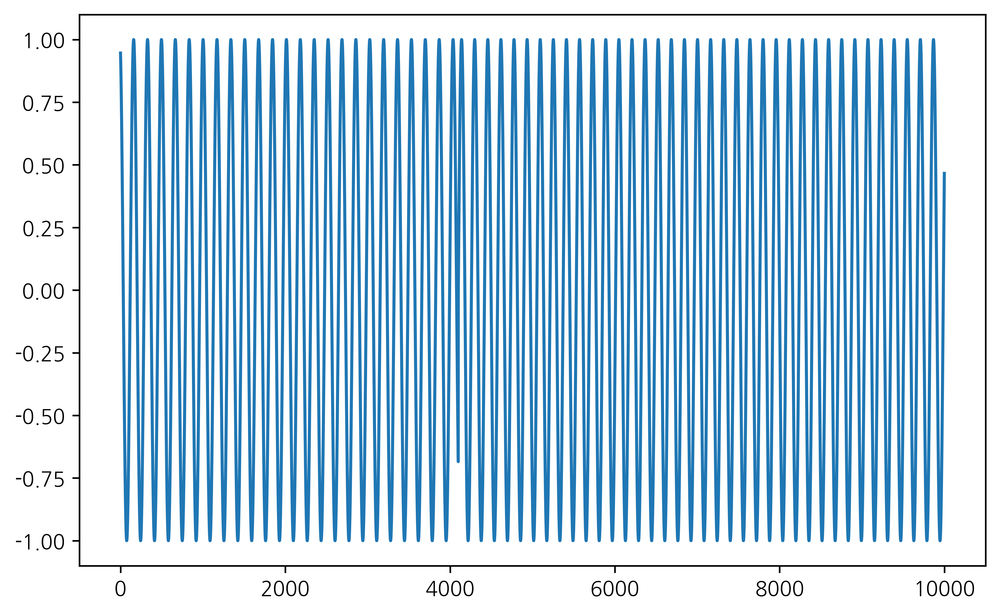

In [19]:
import scipy.io.wavfile

sampling_rate = 44100
sp.io.wavfile.write("octave.wav", sampling_rate, octave)

sr, y_read = sp.io.wavfile.read("octave.wav")

plt.plot(y_read[40000:50000])
plt.show()

연습문제 1

In [20]:
tone_0 = single_tone(941) + single_tone(1336)
tone_1 = single_tone(697) + single_tone(1209)
tone_2 = single_tone(697) + single_tone(1336)
tone_3 = single_tone(697) + single_tone(1477)
tone_4 = single_tone(770) + single_tone(1209)
tone_5 = single_tone(770) + single_tone(1336)
tone_6 = single_tone(770) + single_tone(1477)
tone_7 = single_tone(852) + single_tone(1209)
tone_8 = single_tone(852) + single_tone(1336)
tone_9 = single_tone(852) + single_tone(1477)


In [22]:
num = '0,1,0,8,2,7,9,7,1,3,9'.split(',')
tone = [tone_0, tone_1, tone_2, tone_3, tone_4, tone_5, tone_6, tone_7, tone_8, tone_9]
num = list(zip(notes, freqs))
num

[(('0', 261.62), 261.62),
 (('1', 277.17673474627884), 277.17673474627884),
 (('0', 293.6585210786982), 293.6585210786982),
 (('8', 311.1203654270119), 311.1203654270119),
 (('2', 329.6205450734967), 329.6205450734967),
 (('7', 349.2208026479644), 349.2208026479644),
 (('9', 369.98655218804913), 369.98655218804913),
 (('7', 391.9870974524774), 391.9870974524774),
 (('1', 415.29586321592035), 415.29586321592035),
 (('3', 439.9906403173536), 439.9906403173536),
 (('9', 466.1538452797511), 466.1538452797511)]

In [25]:
call = np.hstack([single_tone(f) for f in tone])
display(Audio(call, rate=44100))

### 데이터 분류

In [41]:
from sklearn.datasets import load_iris

iris = load_iris()
df = pd.DataFrame(iris.data, columns=iris.feature_names)
sy = pd.Series(iris.target, dtype='category')
sy = sy.cat.rename_categories(iris.target_names)
df['species'] = sy


In [42]:
df.tail()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),species
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica
149,5.9,3.0,5.1,1.8,virginica


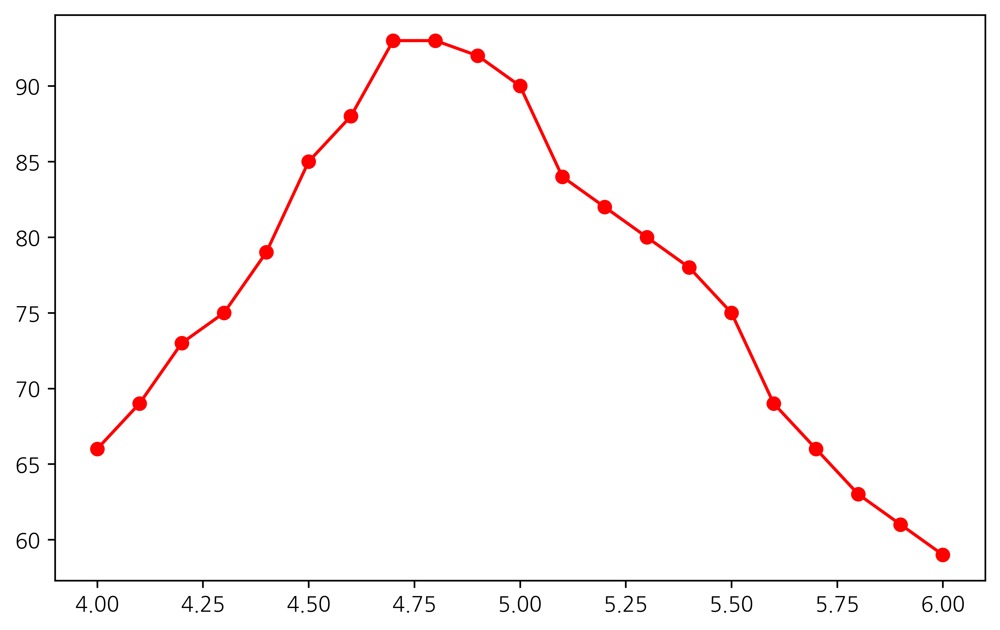

In [43]:
df["species2"] = df["species"] == "versicolor"

thresholds = np.linspace(4, 6, 21)
list_accuracy = []
for t in thresholds:
    df["predict"] = df["petal length (cm)"] <=` t
    accuracy = (df.predict == df.species2).sum()
    list_accuracy.append(accuracy)
    
plt.plot(thresholds, list_accuracy, "ro-")